In [1]:
import os
import math
import numpy as np
import pandas as pd

!pip install matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

!pip install plotly
import plotly.graph_objects as go
from plotly.subplots import make_subplots

!pip install sklearn
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

In [2]:
os.environ["CUDA_VISIBLE_DEVICES"] = ""

### Select Dataset and VLM

In [3]:
from similarity_metrics import Similarity
from dataset import DatasetHandler

if False:
    dataset = DatasetHandler("kinetics_100", "all")
    
if True:
    dataset = DatasetHandler("smsm", "all")    

if False:
    dataset = DatasetHandler("moma_act", "all")

if False:
    dataset = DatasetHandler("moma_sact", "all")
    
if False:
    dataset = DatasetHandler("moma_act", "test")

/home/rob/vlm_benchmark/dataset/dataset_handler.py:5: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [4]:
if True:
    from MILES.wrapper import MILES_SimilarityVLM
    vlm = MILES_SimilarityVLM()
    
if False:
    from CLIP.CLIPVLM import ClipVLM
    vlm = ClipVLM()
    
if False:
    from video_clip.video_clip import VideoClipVLM
    vlm = VideoClipVLM()

Some weights of the model checkpoint at distilbert-base-uncased were not used when initializing DistilBertModel: ['vocab_projector.bias', 'vocab_transform.weight', 'vocab_layer_norm.weight', 'vocab_layer_norm.bias', 'vocab_projector.weight', 'vocab_transform.bias']
- This IS expected if you are initializing DistilBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DistilBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


######USING ATTENTION STYLE:  frozen-in-time


In [5]:
from FewShotTestHandler import FewShotTestHandler
tester = FewShotTestHandler()
dataset.fill_cache(vlm)

  0%|          | 0/10000 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

In [6]:
# folder path for specific vlm/dataset combo
RESULTS_FOLDER = os.path.join("embedding_visualizer", vlm.__class__.__name__, dataset.id())
os.makedirs(RESULTS_FOLDER, exist_ok=True)

### Load Embeddings

In [7]:
# Set fixed order for category names, paths and associated embeddings
category_names = list(dataset.data_dict.keys())
category_paths = [dataset.data_dict[name] for name in category_names]

text_embeds_per_category = [vlm.get_text_embeds(name) for name in category_names]
vid_embeds_per_category = [
    [
        vlm.get_video_embeds(path)
        for path in paths
    ]
    for paths in category_paths
]

### Compute Original Embedding-Space Characteristics

In [8]:
'''
k = len(vid_embeds_per_category[0][0])
noise_per_category = [
    np.linalg.det(np.cov(np.array(vid_embeds))) ** (1/k)
    for vid_embeds in vid_embeds_per_category
]
sorted_category_inds = np.argsort(noise_per_category)[::-1]
for i in sorted_category_inds:
    print(f"{category_names[i]:<30} - {noise_per_category[i]:.5f}")
'''

stat_cols = ["vid-vid mean similarity", "text-vid mean similarity"]
embedding_stat_df = pd.DataFrame(columns=stat_cols)

for i, text_embed in enumerate(text_embeds_per_category):
    vid_embeds = np.array(vid_embeds_per_category[i])
    vid_vid_similarities = vlm.default_similarity_metric()(vid_embeds, vid_embeds).flatten()
    text_vid_similarities = vlm.default_similarity_metric()(text_embed[None, :], vid_embeds).flatten()
    
    embedding_stat_df.loc[category_names[i]] = [
        np.mean(vid_vid_similarities),
        np.mean(text_vid_similarities)
    ]
    
# Save embedding stats as csv
embedding_stat_df.to_csv(os.path.join(RESULTS_FOLDER, "embedding_stats.csv"))

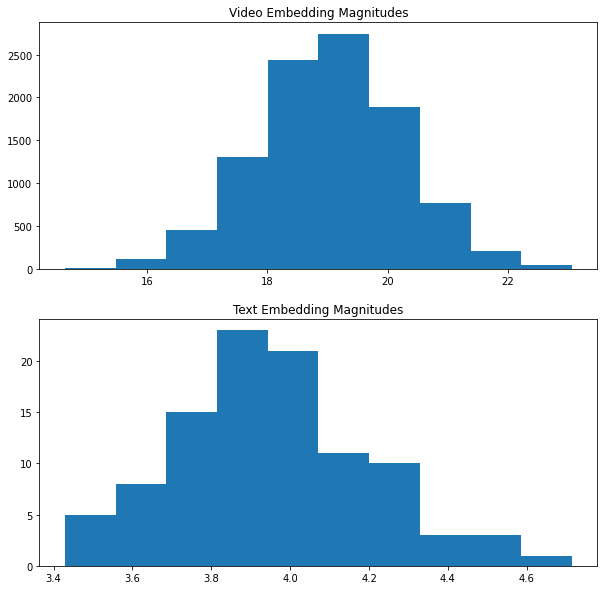

In [9]:
# Plot histogram of video and text embedding magnitudes (unimportant for VLMs which use cosine similarity)
vid_magnitudes = [np.linalg.norm(vid_embed) for vid_embeds in vid_embeds_per_category for vid_embed in vid_embeds]
text_magnitudes = [np.linalg.norm(text_embed) for text_embed in text_embeds_per_category]

fig, axs = plt.subplots(2, figsize=(10, 10))
axs[0].hist(vid_magnitudes)
axs[0].set_title("Video Embedding Magnitudes")
axs[1].hist(text_magnitudes)
axs[1].set_title("Text Embedding Magnitudes")
plt.show()

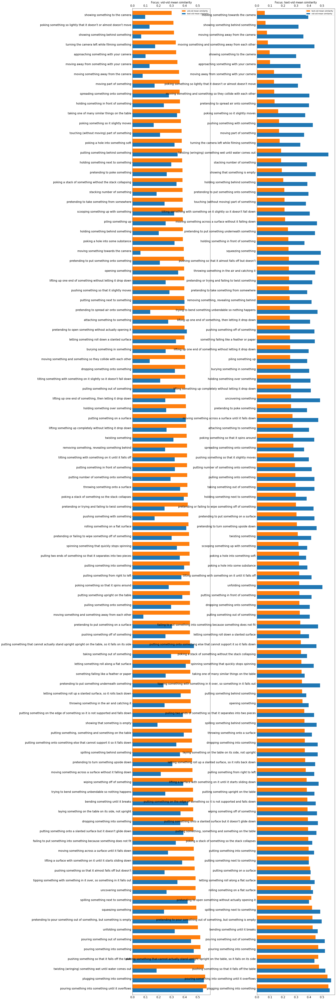

In [10]:
# Plot a bar chart for each stat in sorted order
fig, axs = plt.subplots(ncols = len(stat_cols), figsize=(10 * len(stat_cols), len(embedding_stat_df)))

for i, col in enumerate(stat_cols):
    axs[i].tick_params(axis="x", bottom=True, top=True, labelbottom=True, labeltop=True)
    axs[i].set_title(f"Focus: {col}", fontdict={"fontsize": 15})
    
    reordered_cols = [other_col for other_col in stat_cols if other_col != col] + [col] # So focused col is at the top
    embedding_stat_df.sort_values(col, ascending=False)[reordered_cols].plot.barh(ax=axs[i], legend="reverse", fontsize=15, width=0.8)
    
plt.subplots_adjust(wspace=0.6)
plt.savefig(os.path.join(RESULTS_FOLDER, "embedding_stats.jpg"), bbox_inches="tight")
plt.show()

In [11]:
# Set sorting order for later plots (most interesting / outliers first)
sorted_category_inds = np.argsort(embedding_stat_df["text-vid mean similarity"].values)

### Compute T-SNE Embeddings

In [12]:
# Stack embeddings to perform T-SNE over all together

stacked_embeddings = []
text_stacked_indices = {}
vid_stacked_indices = {}

next_index = 0
for name, text_embed, paths, vid_embeds in zip(category_names, text_embeds_per_category, category_paths, vid_embeds_per_category):
    stacked_embeddings.append(text_embed)
    text_stacked_indices[name] = next_index
    next_index += 1
    
    stacked_embeddings += vid_embeds
    vid_stacked_indices[name] = {path: next_index + i for i, path in enumerate(paths)}
    next_index += len(paths)
        
stacked_embeddings = np.array(stacked_embeddings)



# NOTE: Category-specific T-SNE just spreads all category embeddings out pretty evenly, making good and bad categories look the same

if vlm.default_similarity_metric() is Similarity.COSINE:
    sklearn_metric = "cosine"
elif vlm.default_similarity_metric() is Similarity.DOT:
    # NOTE: This is imperfect. No distance metric can match dot-product ordering without violating triangle inequality
    # (For any 2 vectors which aren't directly opposite each other, a third vector exists with arbitrarily-high similarity to both)
    sklearn_metric = lambda a, b: math.exp(-Similarity.DOT(a[None, :], b[None, :]))
else:
    raise ValueError("Unknown equivalent sklearn metric name")

sne_embeddings = TSNE(n_components=2, metric=sklearn_metric).fit_transform(stacked_embeddings)



# Unstack SNE embeddings into original fixed order of embeddings
text_sne_embeds_per_category = [
    sne_embeddings[text_stacked_indices[name]]
    for name in category_names
]
vid_sne_embeds_per_category = [
    [
        sne_embeddings[vid_stacked_indices[name][path]]
        for path in paths
    ]
    for name, paths in zip(category_names, category_paths)
]

/home/rob/miniconda3/envs/VLM_MILES/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/rob/miniconda3/envs/VLM_MILES/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


### Plot SNE Embeddings

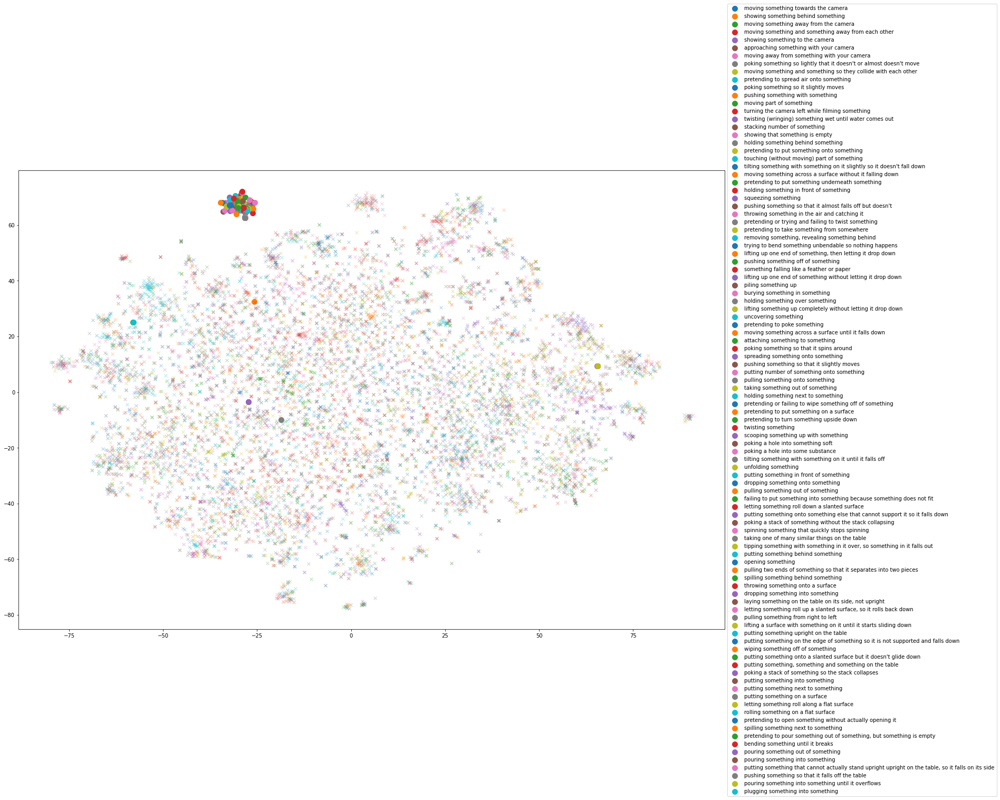

In [13]:
# Combined Plot

fig, ax = plt.subplots(1, 1, figsize=(24, 16))

for category_ind in sorted_category_inds:
    name = category_names[category_ind]
    text_embed = text_sne_embeds_per_category[category_ind]
    vid_embeds = np.array(vid_sne_embeds_per_category[category_ind])
    
    color = next(ax._get_lines.prop_cycler)['color']
    ax.scatter(vid_embeds[:, 0], vid_embeds[:, 1], marker="x", color=color, alpha=0.25)
    ax.scatter([text_embed[0]], [text_embed[1]], label=name, marker="o", color=color, s=100)
    
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.savefig(os.path.join(RESULTS_FOLDER, "embedding_plot_combined.jpg"), bbox_inches="tight")
plt.show()

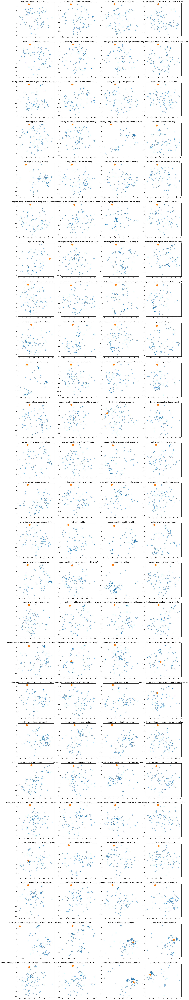

In [14]:
# Plot per category

PLOT_COUNT = len(sorted_category_inds)
N_COLS = 4
N_ROWS = math.ceil(PLOT_COUNT / N_COLS)
FIG_WIDTH = 24

fig, axs = plt.subplots(N_ROWS, N_COLS, figsize=(FIG_WIDTH, FIG_WIDTH / N_COLS * N_ROWS))
for i in range(PLOT_COUNT):
    ax = axs[i // N_COLS][i % N_COLS]
    category_ind = sorted_category_inds[i]
    name = category_names[category_ind]
    text_embed = text_sne_embeds_per_category[category_ind]
    vid_embeds = np.array(vid_sne_embeds_per_category[category_ind])
    
    ax.set_title(name)
    ax.scatter(vid_embeds[:, 0], vid_embeds[:, 1], marker="o", alpha=0.5)
    ax.scatter([text_embed[0]], [text_embed[1]], marker="o", s=200)
plt.savefig(os.path.join(RESULTS_FOLDER, "embedding_plot_per_class.jpg"), bbox_inches="tight")
plt.show()

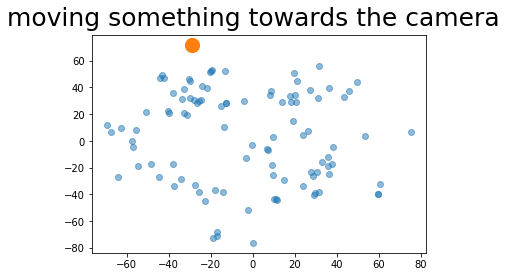

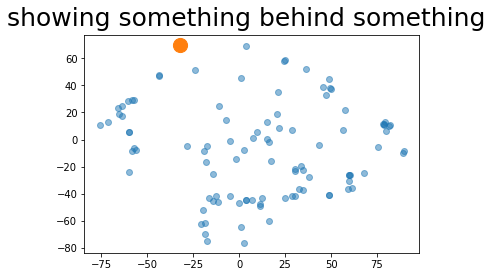

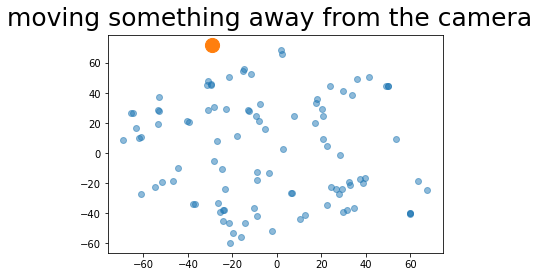

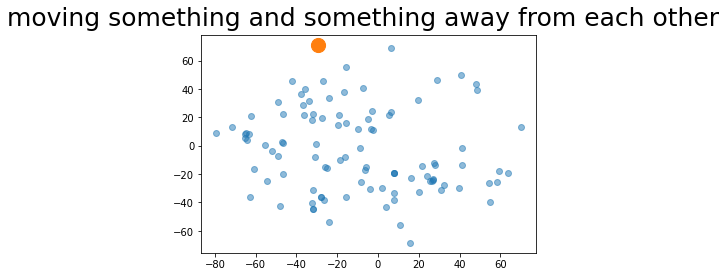

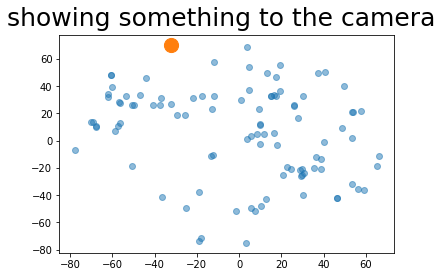

...

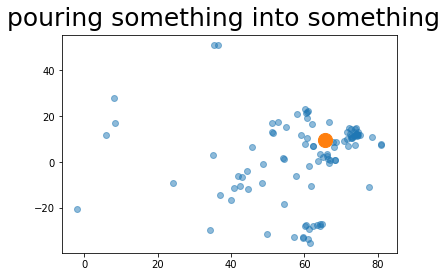

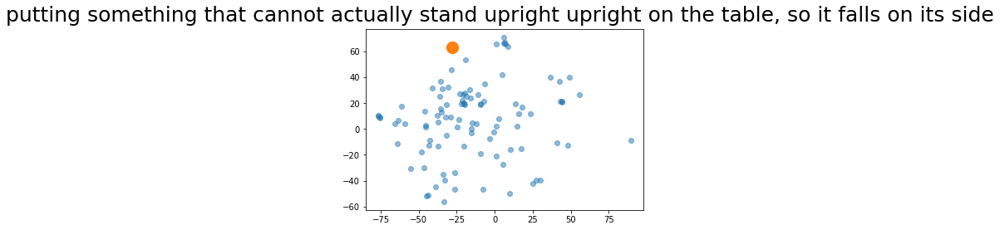

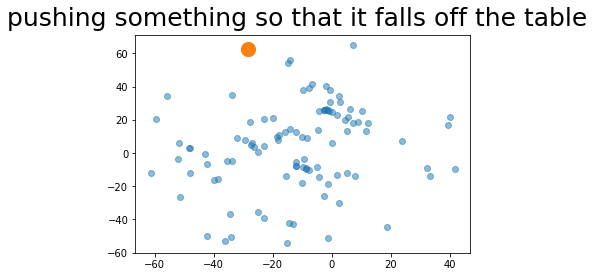

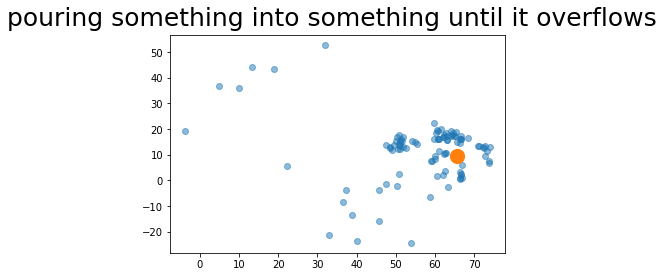

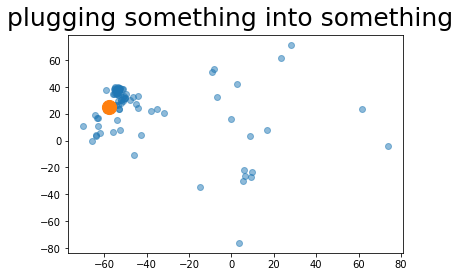

In [15]:
# Save small figure per category
individual_figure_save_folder = os.path.join(RESULTS_FOLDER, "embedding_plots_per_class")
os.makedirs(individual_figure_save_folder, exist_ok=True)

for i in range(len(sorted_category_inds)):
    category_ind = sorted_category_inds[i]
    name = category_names[category_ind]
    text_embed = text_sne_embeds_per_category[category_ind]
    vid_embeds = np.array(vid_sne_embeds_per_category[category_ind])
    
    fig = plt.figure()
    fig.suptitle(name, fontsize=25)
    plt.scatter(vid_embeds[:, 0], vid_embeds[:, 1], marker="o", alpha=0.5)
    plt.scatter([text_embed[0]], [text_embed[1]], marker="o", s=200)
    #plt.xticks([])
    #plt.yticks([])
    plt.savefig(os.path.join(individual_figure_save_folder, name.replace(" ", "_") + ".jpg"), bbox_inches="tight")
    plt.show()

### Interactive SNE Embedding Plots

In [16]:
# Package necessary info in a dataframe
plotting_df = pd.DataFrame(columns=["x", "y", "class", "type", "path"])
for name, text_embed, paths, vid_embeds in zip(category_names, text_sne_embeds_per_category, category_paths, vid_sne_embeds_per_category):    
    for path, vid_embed in zip(paths, vid_embeds):
        small_path = "/".join(path.split("/")[-2:])
        plotting_df.loc[len(plotting_df)] = [vid_embed[0], vid_embed[1], name, "VID", small_path]
        
    plotting_df.loc[len(plotting_df)] = [text_embed[0], text_embed[1], name, "TEXT", "None"]

In [17]:
# Combined Class Plots

fig = go.Figure(layout=dict(width=1600, height=1200, showlegend=False))
for name, df in plotting_df.groupby("class"):
    scatter = go.Scatter(
        mode="markers",
        x=df["x"], y=df["y"],
        text=[f"{name}<br>{point_path}" if point_type == "VID" else name for point_type, point_path in zip(df["type"], df["path"])],
        hovertemplate="%{text}<extra></extra>",
        marker={
            "opacity": 1.0 * (df["type"] == "TEXT") + 0.5 * (df["type"] == "VID"),
            "size": 10 * (df["type"] == "TEXT") + 5 * (df["type"] == "VID")
        },
        name=name
    )
    
    fig.add_trace(scatter)

fig.write_html(os.path.join(RESULTS_FOLDER, "embedding_plot_combined_interactive.html"))
fig.show()

In [18]:
# Individual Class Plots

PLOT_COUNT = len(sorted_category_inds)
N_COLS = 4
N_ROWS = math.ceil(PLOT_COUNT / N_COLS)
FIG_WIDTH = 1600

sorted_category_names = [category_names[cat_ind] for cat_ind in sorted_category_inds]

fig = make_subplots(rows=N_ROWS, cols=N_COLS,
                    vertical_spacing=0.2 / N_ROWS, horizontal_spacing=0.2 / N_COLS,
                    subplot_titles=sorted_category_names[:PLOT_COUNT])
for i in range(PLOT_COUNT):
    name = sorted_category_names[i]
    df = plotting_df[plotting_df["class"] == name]
    
    fig.add_trace(
        go.Scatter(
            mode="markers",
            x=df["x"], y=df["y"],
            text=[point_path if point_type == "VID" else "TEXT" for point_type, point_path in zip(df["type"], df["path"])],
            hovertemplate="%{text}<extra></extra>",
            marker={
                "opacity": 1.0 * (df["type"] == "TEXT") + 0.5 * (df["type"] == "VID"),
                "size": 20 * (df["type"] == "TEXT") + 10 * (df["type"] == "VID")
            }
        ),
        row = i // N_COLS + 1,
        col = i % N_COLS + 1
    )
fig.update_layout(width=FIG_WIDTH, height=FIG_WIDTH / N_COLS * N_ROWS, showlegend=False)

fig.write_html(os.path.join(RESULTS_FOLDER, "embedding_plot_per_class_interactive.html"))
fig.show()